In [1]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import math

test_B={
    "scenes": {"m1.png", "m2.png", "m3.png", "m4.png", "m5.png"},
    "products":{"0.jpg", "1.jpg", "11.jpg", "19.jpg", "24.jpg", "26.jpg", "25.jpg"}
}

test_models_dir="models"
test_scenes_dir="scenes"


class Instance:
    position:tuple =(0,0)
    width=0
    height=0
class ProductInfo:
    name=""
    instances :list[Instance]= []

In [3]:

#the object model acquired at training time should now consist in vectors joining all the features extracted in the model image to their
#barycenter; then, at run time all the image features matched with respect to the model would cast votes for the position of the barycenter
# by scaling appropriately the associated joining vectors (i.e. by the ratio of sizes between the matching features)
from scipy.ndimage import maximum_filter, label


def calculate_barycenter(keypoints):
    # Extract the x and y coordinates from the keypoints
    x_coords = [kp.pt[0] for kp in keypoints]
    y_coords = [kp.pt[1] for kp in keypoints]
    
    # Calculate the barycenter (centroid) coordinates
    barycenter_x = np.mean(x_coords)
    barycenter_y = np.mean(y_coords)
    
    return (barycenter_x, barycenter_y)
# Function to calculate the joining vectors from keypoints to the barycenter
def calculate_joining_vectors(keypoints, reference):
    joining_vectors = []
    
    for kp in keypoints:
        # Keypoint coordinates
        keypoint_x, keypoint_y = kp.pt
        
        # Calculate the vector from the keypoint to the barycenter
        vector_x = reference[0] - keypoint_x
        vector_y = reference[1] - keypoint_y
        
        # Append the vector to the list
        joining_vectors.append((vector_x, vector_y))
    
    return joining_vectors
      ## OFFLINE PHASE 

def offline_phase(img_model):
    # Creating SIFT object
    sift = cv2.SIFT_create(sigma = 1.6)
    # 1 - Detect kpts and compute the descriptors in the model image 
    kp_model = sift.detect(img_model)
    kp_model, des_model = sift.compute(img_model, kp_model)
    # 2 - Choose the baricenter as reference point 
    ref_point= calculate_barycenter(kp_model)
    # 3- for every feature pts calculate the joing vectoor to the refrence pts
    joning_vectors=calculate_joining_vectors(keypoints=kp_model,reference=ref_point)
    # if not debug:
    #     print(ref_point)
    #     print(joning_vectors)
    return kp_model, des_model,joning_vectors



def find_local_maxima_above_threshold(arr, threshold):
    # Create a filter that marks the local maxima
    neighborhood_size = 5  # Neighborhood size for comparison
    local_max = maximum_filter(arr, size=neighborhood_size) == arr
    
    # Exclude the borders of the array
    background = (arr == 0)
    
    # Apply the threshold condition
    threshold_mask = arr > threshold
    
    # Combine the local maxima condition with the threshold condition
    maxima_with_threshold = local_max & threshold_mask & ~background
    
    # Label the local maxima
    labeled, num_features = label(maxima_with_threshold)
    #print(num_features)
    
    # Extract the coordinates of the local maxima
    maxima_coords = np.column_stack(np.where(labeled > 0))
    
    return maxima_coords


trovato 209 matches
Instance { position: (185,254), width: 364px, height: 507px}
Instance { position: (551,247), width: 341px, height: 494px}
product 24.jpg - 2 found


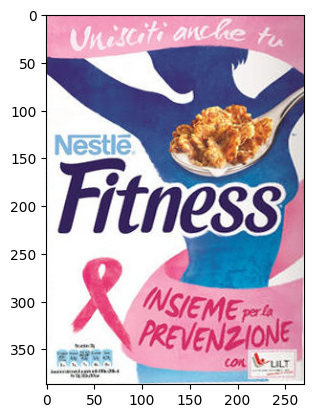

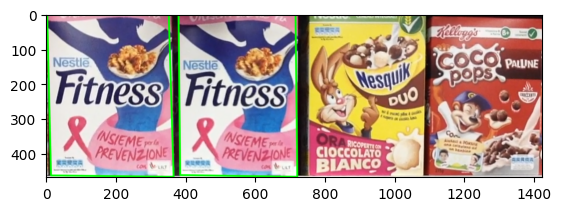

In [42]:

    
def draw_red_point(image, coord, radius=5, thickness=5):
    # Draw a red circle (point) on the image
    # coord is in the format (x, y)
    cv2.circle(image, coord, radius, (0, 0, 255), thickness)  # BGR color (0, 0, 255) is red in OpenCV
    cv2.imshow('Image with Red Point', image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
    return image
## 
def online_phase(img_target,des_model,kp_model,joning_vectors,img_model):
     # Creating SIFT object
    sift = cv2.SIFT_create(sigma = 1.0)
    # 1 - Detect keypoints and compute descriptors in the target image and initialize an accumulator array, A[Pc]
    kp_target = sift.detect(img_target)
    kp_target, des_target = sift.compute(img_target, kp_target)
    # 2 - Match descriptors between target and model features
    # Initializing the matching algorithm
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks = 50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    # Matching the descriptors
    matches = flann.knnMatch(des_model,des_target,k=2)
    # Keeping only good matches as per Lowe's ratio test.
    good = []
    for m,n in matches:
        if m.distance < 0.7*n.distance:
            good.append(m)
    # 3 - For each target feature that matches a model feature, compute the position of the reference point and 
    # cast a vote into the accumulator array
    #print("trovato "+str(len(good))+" matches")
    #dst_pts = np.int16([ kp_target[m.trainIdx].pt for m in good ])
    #TO-DO castare il voto
    #print(dst_pts)
    #print(dst_pts.shape)
    print("trovato "+str(len(good))+" matches")
      # Drawing matches
    draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                    singlePointColor = None,
                    # draw only inliers
                    flags = 2)
    # image_with_matches = cv2.drawMatches(img_model,kp_model,img_target,kp_target,good,None,**draw_params)
    # cv2.imshow('Image with Keypoints', image_with_matches)
    # cv2.waitKey(0)
    # cv2.destroyAllWindows()
    K=25
    n_bins=img_target.shape[1]//K
    m_bins=img_target.shape[0]//K
    accumulator_array = np.zeros((n_bins,m_bins))
    counter=0
    #print("limi: "+str(accumulator_array.shape[0])+ ":" +str(accumulator_array.shape[1]) )
    # Create a dictionary to store values with coordinates as keys
    acc_matches  = [[[] for _ in range(m_bins)] for _ in range(n_bins)]
    for m in good:
        model_pt=kp_model[m.queryIdx]
        target_pt=kp_target[m.trainIdx]
        delta_angle= np.radians(target_pt.angle-model_pt.angle)
        x_vector=joning_vectors[m.queryIdx][1]
        y_vector=joning_vectors[m.queryIdx][0]
        delta_size=target_pt.size/model_pt.size   
        #x_new = x * np.cos(angle_radians) - y * np.sin(angle_radians)
        #y_new = x * np.sin(angle_radians) + y * np.cos(angle_radians)
        x_rotated= x_vector * np.cos(delta_angle) - y_vector* np.sin(delta_angle)
        y_rotated=x_vector * np.sin(delta_angle) +  y_vector * np.cos(delta_angle)
        # print("ang:"+str(delta_angle))
        # print(delta_size)
        # print("vector: "+str(x_vector)+", "+str(y_vector))
        # print("rotated :"+str(x_rotated)+"," +str(y_rotated))
        x=round(target_pt.pt[1]+delta_size*x_rotated)
        y=round(target_pt.pt[0]+delta_size*y_rotated)
        i=y//K
        j=x//K
        if (i>=accumulator_array.shape[0] or j>=accumulator_array.shape[1] or i<=0 or j<=0):
            counter=counter+1
            #print("ij"+str(i)+":"+str(j)+" --- "+"xy"+str(x)+":"+str(y))
            continue
        accumulator_array[i][j]+=1
        acc_matches[i][j].append(m)
        #accumulator_array[x][y]=accumulator_array[x][y]+1
    #print(str(counter)+" sono fuori")
    #print(accumulator_array)
    local_maxima = find_local_maxima_above_threshold(accumulator_array,5)
    #print(np.column_stack(np.where(accumulator_array > 1)))
    #print("Local maxima coordinates:")
    return local_maxima, acc_matches, kp_target

def detectMulti(product, scene):
    
    img_bgr= cv2.imread(test_scenes_dir+'/'+scene) 
    rgb_scene = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    rgb_model = cv2.cvtColor( cv2.imread(test_models_dir+'/'+product) , cv2.COLOR_BGR2RGB)
    # split the model into 3 diffent channels of red, green and blue
    r, g, b = cv2.split(rgb_model)
    # save the means of intensity for each channel
    r_mean = np.mean(r)
    g_mean = np.mean(g)
    b_mean = np.mean(b)
    # Load the query and the train images
    img_train = cv2.imread(test_scenes_dir+'/'+scene,0) # trainImage
    img_model = cv2.imread(test_models_dir+'/'+product,0) # queryImage
    kp_model, des_model,joning_vectors = offline_phase(img_model=img_model)
    local_maxima, acc_matches, kp_target=online_phase(img_target=img_train,des_model=des_model,kp_model=kp_model,joning_vectors=joning_vectors,img_model=img_model)
    found=False
    for coord in local_maxima:
        #print(str(coord) +" "+ str(len(acc_matches[coord[0]][coord[1]])))
            # If we have at least 10 matches we find the box of the object
        good=acc_matches[coord[0]][coord[1]]
        MIN_MATCH_COUNT = 10
        #print(len(good))
        if len(good)>MIN_MATCH_COUNT:
            
            src_pts = np.float32([ kp_model[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
            dst_pts = np.float32([ kp_target[m.trainIdx].pt for m in good ]).reshape(-1,1,2)        
            # Calculating homography based on correspondences
            H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
            # Apply homography to project corners of the query image into the image scene
            h,w = img_model.shape
            pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
            dst = cv2.perspectiveTransform(pts,H) 
            #tl bl br tr
            width_box = dst[2][0][0] - dst[0][0][0]
            height_box = dst[2][0][1] - dst[0][0][1]
            tl = dst[0][0] # x y
            bl = dst[1][0]
            br = dst[2][0]
            tr = dst[3][0]
            # only > 0 coordinate
            if(tl[0]<0):
                tl[0]=0
            if(tl[1]<0):
                tl[1]=0
            if(br[0]<0):
                br[0]=0
            if(br[1]<0):
                br[1]=0 
            if(tr[0]<0):
                tr[0]=0
            if(tr[1]<0):
                tr[1]=0
            if(bl[0]<0):
                bl[0]=0
            if(bl[1]<0):
                bl[1]=0
            x_center_box=round(dst[0][0][0]+(width_box)/2)
            y_center_box=round(dst[0][0][1]+(height_box)/2)
            
            # check based on coords if the vox looks like a rectangle
            
            # rect_score= rectangleness(tl=tl,bl=bl,br=br,tr=tr)
            # print(rect_score)
            # if (rect_score< 0.45):
            #     print("non è un rettangolo")
            #     continue
            #crop the region of interest of the scene image rgb, y x 
            crop_img = rgb_scene[int(tl[1]):int(br[1]),int(tl[0]):int(br[0])]
            # plot the cropped image
            # plt.imshow(crop_img)
            # plt.show()
            
            # compute the mean of each channel in the cropped image
            r_crop, g_crop, b_crop = cv2.split(crop_img)
            r_crop_mean = np.mean(r_crop)
            g_crop_mean = np.mean(g_crop)
            b_crop_mean = np.mean(b_crop)
            # compute the difference between the means of the channels in the cropped image and the means of the channels in the model image
            r_diff = r_crop_mean - r_mean
            g_diff = g_crop_mean - g_mean
            b_diff = b_crop_mean - b_mean
            # if the difference is less tha a thereshold, the object is the same
            #print(r_diff,g_diff,b_diff)
            color_d = ((r_diff)**2 +(g_diff)**2+(b_diff)**2)**0.5
            #print(color_d)
            if color_d >  60:
                print("not color")
                continue
            found=True
            #Instance 1 {position: (256,328), width: 57px, height: 80px}
            print(f"Instance {{ position: ({x_center_box},{y_center_box}), width: {round(width_box)}px, height: {round(height_box)}px}}")
            # Drawing bounding box
            rgb_scene = cv2.polylines(rgb_scene,[np.int32(dst)],True,(0,255,0),3, cv2.LINE_AA)
        else:
            #print( "Not enough matches are found - {}/{}".format(len(good), MIN_MATCH_COUNT) )
            matchesMask = None
       
    if(found):
        print("product "+product +" - "+str(len(local_maxima))+" found")
        plt.imshow(rgb_model)
        plt.show()
        plt.imshow(rgb_scene)
        plt.show()

    return 

detectMulti("24.jpg","m1.png")
    
    

            

    

---- scena m2.png
trovato 366 matches
Instance { position: (178,298), width: 348px, height: 436px}
product 0.jpg - 1 found


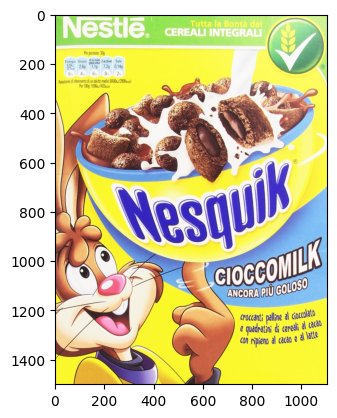

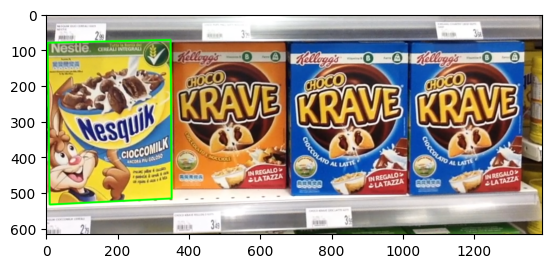

trovato 71 matches
not color
trovato 143 matches
not color
Instance { position: (869,277), width: 342px, height: 426px}
Instance { position: (1185,256), width: 300px, height: 395px}
product 1.jpg - 3 found


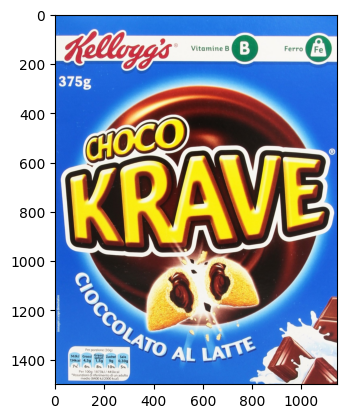

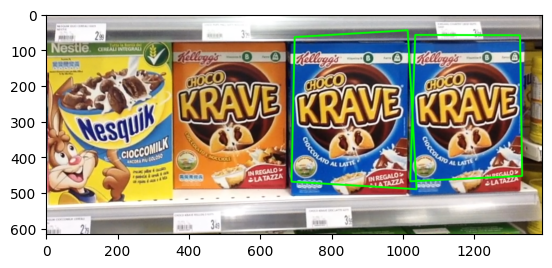

trovato 43 matches
trovato 8 matches
trovato 30 matches
trovato 102 matches
Instance { position: (235,361), width: 471px, height: 588px}
product 26.jpg - 1 found


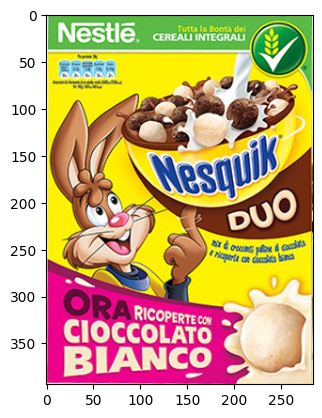

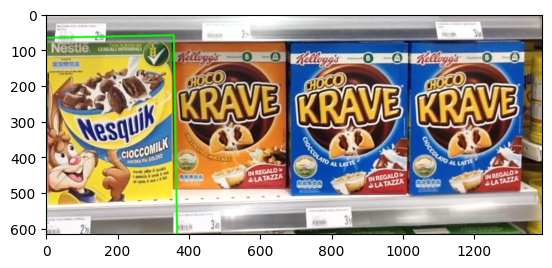

---- scena m1.png
trovato 143 matches
Instance { position: (949,169), width: 247px, height: 339px}
product 0.jpg - 1 found


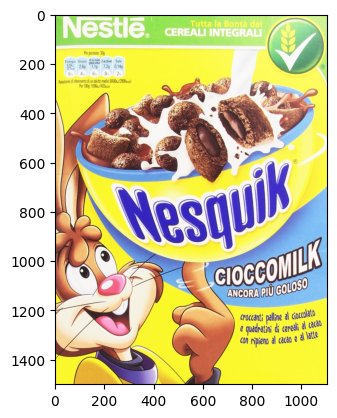

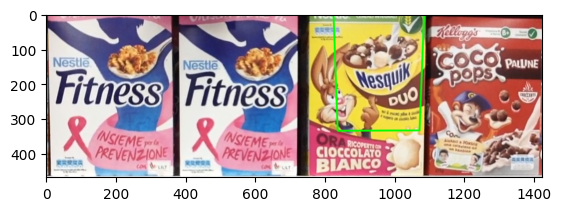

trovato 11 matches
trovato 86 matches
trovato 261 matches
Instance { position: (1264,232), width: 303px, height: 449px}
product 25.jpg - 1 found


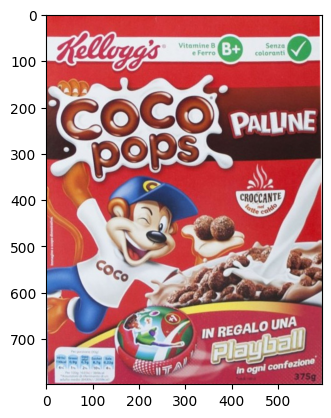

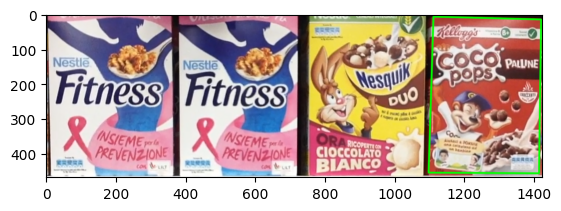

trovato 4 matches
trovato 207 matches
Instance { position: (185,254), width: 364px, height: 507px}
Instance { position: (551,247), width: 341px, height: 494px}
product 24.jpg - 2 found


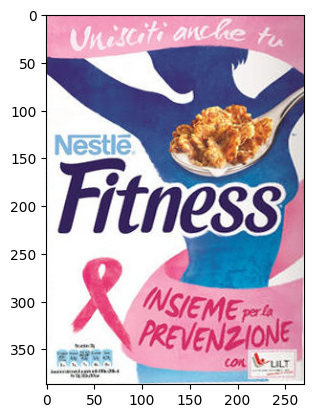

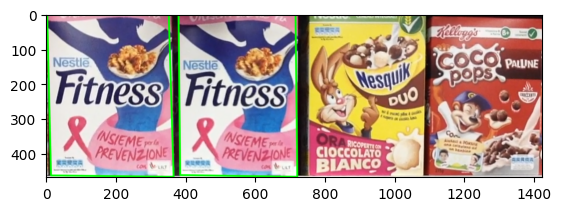

trovato 240 matches
Instance { position: (919,243), width: 330px, height: 486px}
product 26.jpg - 1 found


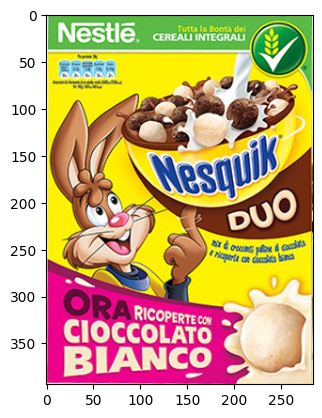

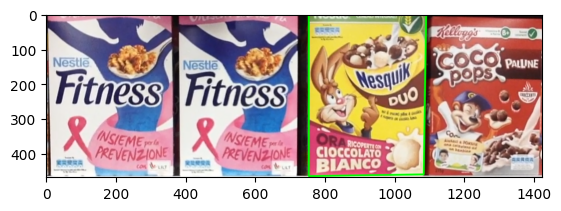

---- scena m5.png
trovato 75 matches
trovato 64 matches
trovato 168 matches
not color
Instance { position: (504,721), width: 315px, height: 406px}
Instance { position: (832,710), width: 295px, height: 402px}
product 1.jpg - 3 found


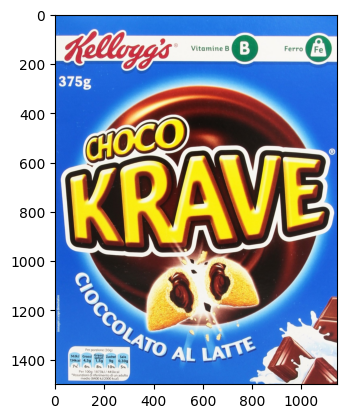

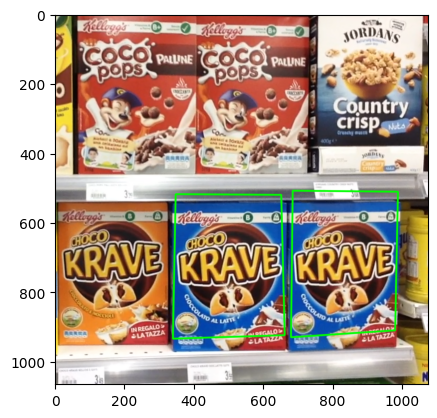

trovato 161 matches
Instance { position: (231,235), width: 330px, height: 470px}
Instance { position: (573,258), width: 362px, height: 496px}
product 25.jpg - 2 found


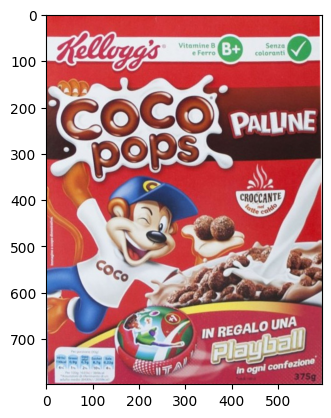

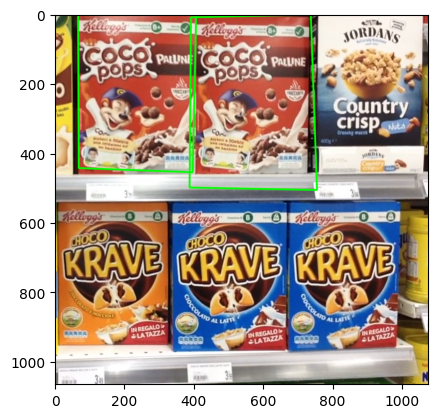

trovato 164 matches
Instance { position: (909,194), width: 291px, height: 387px}
product 19.jpg - 1 found


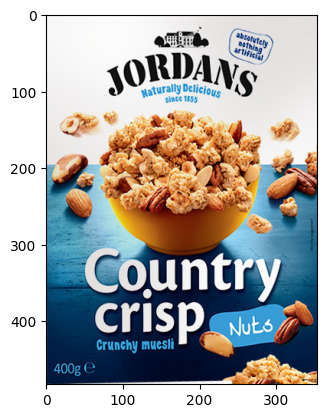

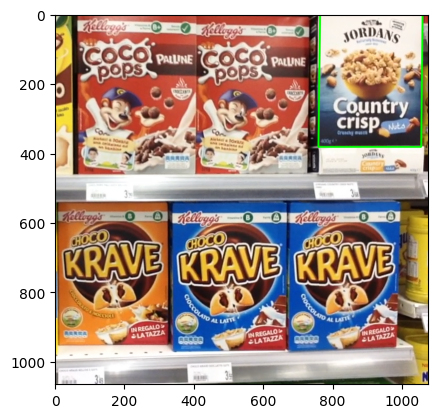

trovato 15 matches
trovato 5 matches
---- scena m4.png
trovato 118 matches
Instance { position: (965,164), width: 248px, height: 329px}
product 0.jpg - 1 found


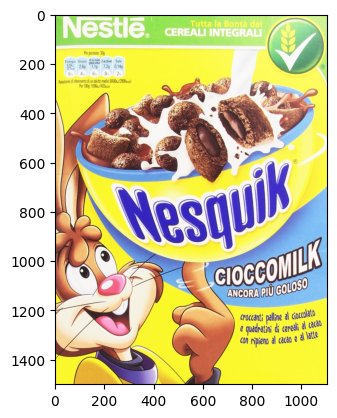

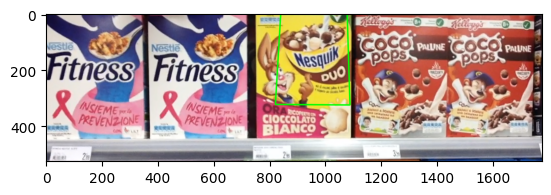

trovato 3 matches
trovato 55 matches
trovato 159 matches
Instance { position: (1277,259), width: 366px, height: 518px}
Instance { position: (1591,221), width: 296px, height: 442px}
product 25.jpg - 2 found


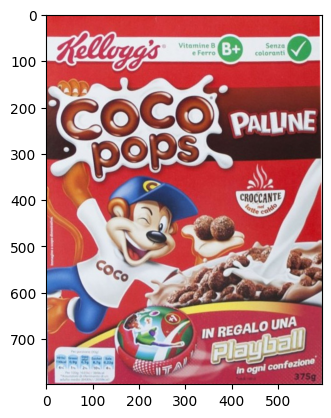

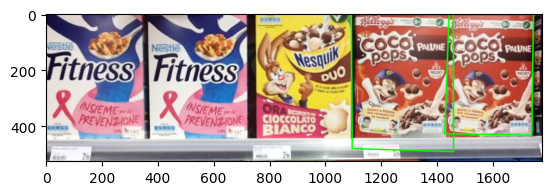

trovato 8 matches
trovato 167 matches
Instance { position: (192,257), width: 384px, height: 513px}
Instance { position: (539,254), width: 362px, height: 508px}
product 24.jpg - 2 found


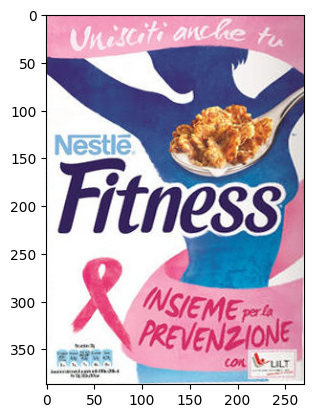

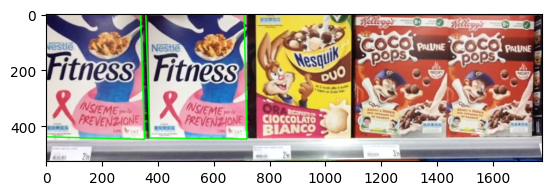

trovato 181 matches
Instance { position: (920,246), width: 344px, height: 492px}
product 26.jpg - 1 found


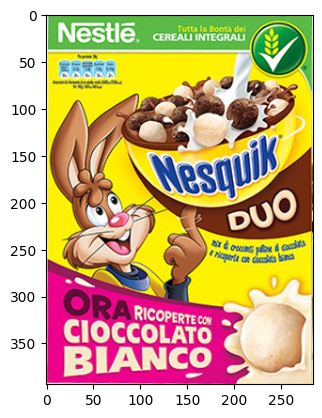

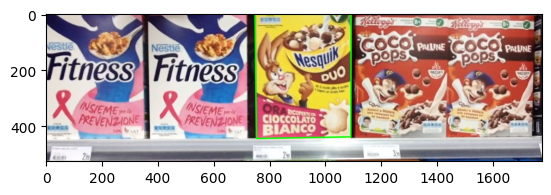

---- scena m3.png
trovato 111 matches
Instance { position: (229,175), width: 269px, height: 349px}
product 0.jpg - 1 found


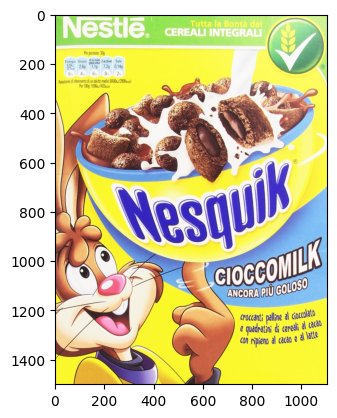

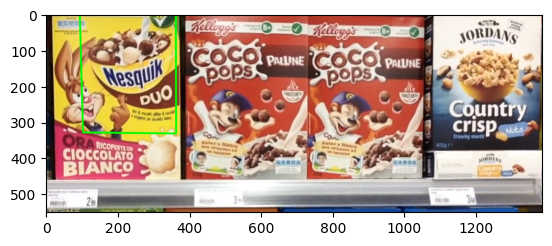

trovato 5 matches
trovato 67 matches
trovato 201 matches
Instance { position: (559,232), width: 331px, height: 465px}
Instance { position: (889,224), width: 310px, height: 443px}
product 25.jpg - 2 found


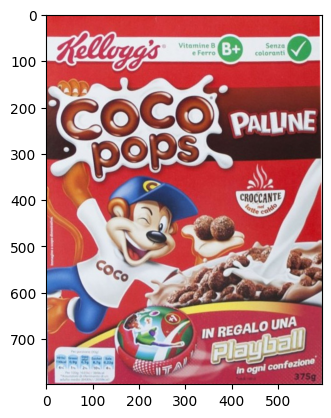

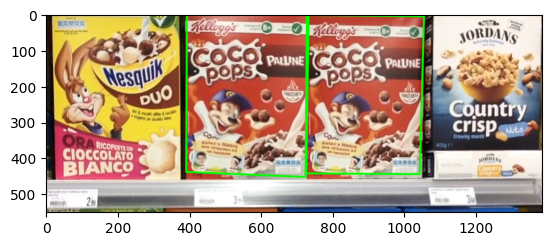

trovato 193 matches
Instance { position: (1233,193), width: 291px, height: 386px}
product 19.jpg - 1 found


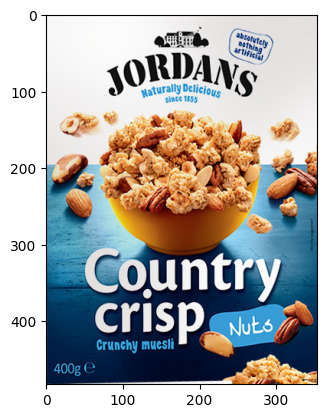

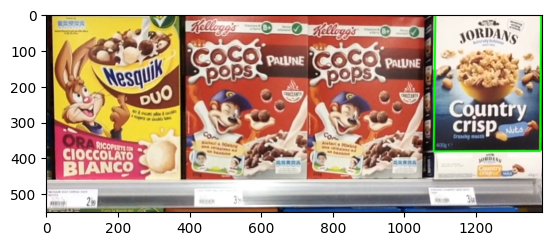

trovato 9 matches
trovato 273 matches
Instance { position: (193,254), width: 364px, height: 508px}
product 26.jpg - 1 found


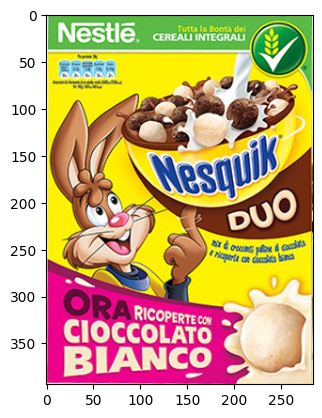

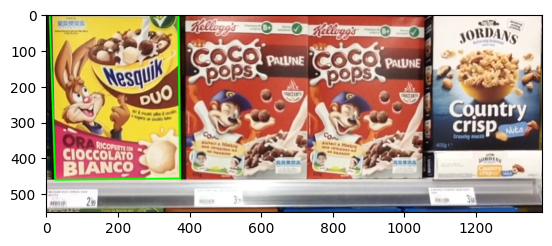

In [43]:
test_B={
    "scenes": {"m1.png", "m2.png", "m3.png", "m4.png", "m5.png"},
    "products":{"0.jpg", "1.jpg", "11.jpg", "19.jpg", "24.jpg", "26.jpg", "25.jpg"}
}

for s in test_B["scenes"]:
    print("---- scena "+s)
    for p in test_B["products"]:
        detectMulti(p,s)